In [2]:
import numpy as np
import skimage
import skimage.data
import skimage.io
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from matplotlib.patches import Patch
import ipywidgets as ipw
import sklearn.model_selection
import sklearn.neighbors
import sklearn.metrics
from sklearn.metrics import classification_report, confusion_matrix,ConfusionMatrixDisplay, f1_score
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.layers import Dense, Activation, Conv2D, MaxPooling2D, Flatten, Dropout
from keras.callbacks import ModelCheckpoint, EarlyStopping
from typing import Dict, List, Tuple, Any
from ipywidgets import Layout, VBox
from ipywidgets import Tab, Output
from IPython.display import display
from plotly.subplots import make_subplots
import numpy as np
import sklearn.metrics
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import Sequential 
from typing import Any, List, Dict, Tuple
from ipywidgets import Output, Tab, Layout, VBox
from IPython.display import display
import plotly.graph_objects as go


# Functions

In [3]:
def resize_and_save_folder(input_dir, output_dir, wscale=1.0, hscale=1.0):
    os.makedirs(output_dir, exist_ok=True)

    files = sorted([
        f for f in os.listdir(input_dir)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ])

    for f in files:
        in_path = os.path.join(input_dir, f)
        out_path = os.path.join(output_dir, f)

        with Image.open(in_path) as img:
            new_size = (int(img.width * wscale), int(img.height * hscale))
            img_resized = img.resize(new_size, Image.LANCZOS)
            img_resized.save(out_path)

    print(f"Saved {len(files)} images in: {output_dir}")
    

def resize_and_save_all(paths, out_root="dataset/resized", wscale=1.0, hscale=1.0):
    
    if os.path.exists(out_root):
        print(f"{out_root} already exists. Skipping resizing.")
        return
    
    out_paths = {
        key: os.path.join(out_root, key)
        for key in ["orig", "label", "rgb"]
    }

    resize_and_save_folder(paths["orig"],  out_paths["orig"],  wscale, hscale)
    resize_and_save_folder(paths["label"], out_paths["label"], wscale, hscale)
    resize_and_save_folder(paths["rgb"],   out_paths["rgb"],   wscale, hscale)

def load_resized_images(orig_dir, label_dir, rgb_dir):
    orig_image = []
    label_image = []
    rgb_image = []

    # ORIG
    orig_files = sorted([f for f in os.listdir(orig_dir) if f.endswith((".jpg",".png",".jpeg"))])
    for f in orig_files:
        orig_image.append(Image.open(os.path.join(orig_dir, f)))

    # LABEL
    label_files = sorted([f for f in os.listdir(label_dir) if f.endswith((".jpg",".png",".jpeg"))])
    for f in label_files:
        label_image.append(Image.open(os.path.join(label_dir, f)))

    # RGB
    rgb_files = sorted([f for f in os.listdir(rgb_dir) if f.endswith((".jpg",".png",".jpeg"))])
    for f in rgb_files:
        rgb_image.append(Image.open(os.path.join(rgb_dir, f)))

    return orig_image, label_image, rgb_image


In [4]:
def pick_random_centers(mask, size=100, ignore=0):
    mask_ignored = mask.copy()
    mask_ignored[:ignore,:]=False
    mask_ignored[-ignore:,:]=False
    mask_ignored[:,:ignore]=False
    mask_ignored[:,-ignore:]=False
    rs, cs = np.where(mask_ignored)
    if len(rs) < 3:
        return None,None
    ix = np.random.randint(len(rs), size=size)
    return rs[ix], cs[ix]

In [5]:
def plot_confusion_matrix(y_true, y_pred, labels=['True', 'False'], report=False, title="Confusion Matrix"):
    if report:
        print(classification_report(y_true, y_pred, digits=4))
    
    print(f"F1 Score (weighted): {f1_score(y_true, y_pred, average='weighted') * 100:.2f}%")
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(cmap="Blues")
    plt.title(title)
    plt.tight_layout()
    plt.show()
    

In [6]:
def compile_fit_with_tabs(model: Sequential, X_train: np.ndarray, y_train: np.ndarray, 
                          X_val: np.ndarray, y_val: np.ndarray, 
                          epochs: int = 50, batch_size: int = 8, patience: int = 10) -> Any:
    
    # Define a layout to make widgets use the full width
    full_width_layout = Layout(width='100%')
    summary_out = Output(layout=full_width_layout)
    fit_out = Output(layout=full_width_layout)
    
    # Create the Tab widget
    tab_widget = Tab(children=[summary_out, fit_out], layout=full_width_layout)
    tab_widget.set_title(0, 'Model Summary')
    tab_widget.set_title(1, 'Model Training')
    
    # Display the tab widget
    display(VBox([tab_widget], layout=Layout(width='100%', align_items='stretch')))
    
    with summary_out:
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        model.summary()
    
    with fit_out:
        es = EarlyStopping(monitor="val_loss", patience=patience, restore_best_weights=True)
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=1,
            callbacks=[es]
        )

    
    return history

In [7]:
def plot_loss_and_accuracy(history: Any, title: str = "Training History Comparison", width: int = 1150, height: int = 500):
    df = pd.DataFrame(history.history)
    epochs = df.index + 1
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=epochs, y=df["loss"], name="Train Loss", line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=epochs, y=df["val_loss"], name="Validation Loss", line=dict(color='red', dash='dot')))
    fig.add_trace(go.Scatter(x=epochs, y=df["accuracy"], name="Train Accuracy", line=dict(color='green')))
    fig.add_trace(go.Scatter(x=epochs, y=df["val_accuracy"], name="Validation Accuracy", line=dict(color='orange', dash='dot')))
    
    fig.update_layout(title_text=title,xaxis_title="Epoch", height=height,width=width)
    fig.show()


def plot_metrics_comparison(loss_values: List[float], acc_values: List[float], title: str = "Final Metrics Comparison", width: int = 1150, height: int = 500):
   
    labels = ['Training', 'Validation', 'Test']
    
    fig = make_subplots(rows=1, cols=2, subplot_titles=("Accuracy", "Loss (Binary Crossentropy)")) 
    colors = ['#4CAF50', '#FFC107', '#007BFF']

    fig.add_trace(go.Bar(x=labels, y=acc_values, name="Accuracy", marker_color=colors), row=1, col=1)
    fig.add_trace(go.Bar(x=labels, y=loss_values, name="Loss", marker_color=colors), row=1, col=2)
    
    fig.update_layout(title_text=title, showlegend=False,height=height, width=width)
    
    fig.update_yaxes(title_text="Accuracy", range=[0, 1.05], row=1, col=1)
    fig.update_yaxes(title_text="Loss Value", row=1, col=2)
    
    fig.show()


def show_classification_results(
    model: Sequential,
    history: Any, 
    X_train: np.ndarray, 
    y_train: np.ndarray,
    X_val: np.ndarray, 
    y_val: np.ndarray,
    X_test: np.ndarray, 
    y_test: np.ndarray,
    plot_width: int = 800, 
    plot_height: int = 500
):
   
    results_train = model.evaluate(X_train, y_train, verbose=0)
    results_val = model.evaluate(X_val, y_val, verbose=0)
    results_test = model.evaluate(X_test, y_test, verbose=0)
    
    loss_train, acc_train = results_train[0], results_train[1]
    loss_val, acc_val = results_val[0], results_val[1]
    loss_test, acc_test = results_test[0], results_test[1]
    
    y_pred_proba = model.predict(X_test, verbose=0)
    y_pred_bin = (y_pred_proba > 0.5).astype(int) 
    y_true_bin = y_test.astype(int) 
    
    loss_values = [loss_train, loss_val, loss_test]
    acc_values = [acc_train, acc_val, acc_test]

    full_width_layout = Layout(width='100%')
    history_out = Output(layout=full_width_layout)
    metrics_out = Output(layout=full_width_layout)
    cm_out = Output(layout=full_width_layout)
    
    tab_widget = Tab(children=[history_out, metrics_out, cm_out], layout=full_width_layout)
    tab_widget.set_title(0, 'Training History (Loss & Acc)')
    tab_widget.set_title(1, 'Final Metrics')
    tab_widget.set_title(2, 'Confusion Matrix')
    
    display(VBox([tab_widget], layout=Layout(width='100%', align_items='stretch')))
    
    with history_out:
        plot_loss_and_accuracy(history, width=plot_width, height=plot_height)

    with metrics_out:
        plot_metrics_comparison(loss_values, acc_values, width=plot_width, height=plot_height)
        
    with cm_out:
        plot_confusion_matrix(y_true_bin, y_pred_bin, title='Confusion Matrix on Test Set')    

# 1. Read Dataset

In [8]:
base = "dataset"
paths = {
    "label": os.path.join(base, "label_images_semantic"),
    "orig": os.path.join(base, "original_images"),
    "rgb":  os.path.join(base, "RGB_color_image_masks")
}

orig_files = sorted([f for f in os.listdir(paths["orig"]) if f.endswith(".jpg")])
df = pd.read_csv(os.path.join(base, "class_dict_seg.csv"))
color_items = [(row["name"], (int(row["r"]), int(row["g"]), int(row["b"]))) for i, row in df.iterrows()]


In [9]:
n_total = len(orig_files)

### 1.1. Index checks 

In [10]:
for name, path in paths.items():
    count = len([f for f in os.listdir(path) if f.lower().endswith((".jpg",".png"))])
    print(f"{name} images: {count}")

label images: 400
orig images: 400
rgb images: 400


In [11]:
indices = [int(os.path.splitext(f)[0]) for f in orig_files]

print("Lowest index:", min(indices))
print("Highest index:", max(indices))

Lowest index: 0
Highest index: 598


In [12]:
expected = set(range(min(indices), max(indices)+1))
actual = set(indices)

missing = sorted(list(expected - actual))

if missing:
    print("Missing indices:", missing)
else:
    print("No missing indices, numbering is continuous.")

Missing indices: [7, 9, 10, 12, 17, 20, 24, 25, 27, 29, 30, 32, 33, 34, 36, 37, 39, 46, 48, 50, 54, 61, 64, 66, 67, 69, 72, 76, 82, 84, 85, 87, 90, 91, 93, 94, 96, 97, 105, 108, 114, 115, 125, 127, 129, 131, 132, 142, 143, 144, 151, 152, 168, 169, 183, 184, 187, 189, 191, 196, 197, 201, 203, 205, 210, 211, 212, 218, 224, 227, 231, 241, 242, 245, 247, 249, 253, 254, 256, 264, 267, 268, 269, 270, 274, 278, 279, 280, 282, 284, 285, 286, 291, 293, 297, 300, 307, 308, 315, 317, 319, 327, 328, 333, 336, 337, 340, 343, 350, 352, 353, 354, 357, 358, 359, 360, 362, 364, 365, 368, 369, 370, 371, 374, 377, 379, 384, 387, 392, 394, 395, 396, 399, 400, 401, 402, 404, 405, 407, 415, 417, 418, 422, 432, 436, 441, 448, 449, 450, 453, 456, 459, 466, 468, 469, 471, 477, 481, 482, 483, 486, 487, 490, 492, 495, 496, 503, 504, 505, 506, 511, 516, 519, 520, 522, 523, 527, 528, 534, 539, 541, 542, 546, 547, 548, 550, 552, 553, 555, 557, 562, 571, 575, 577, 578, 581, 589, 595, 597]


In [13]:
print(f"Da eseguire solo una volta per mettere a posto il nome delle immagini siccome alcune sono mancanti")

# # Rename all files with a "t_" prefix to avoid name conflicts
# for new_idx, f_jpg in enumerate(orig_files):
#     base_name = os.path.splitext(f_jpg)[0]
#     f_png = base_name + ".png"

#     temp_name_jpg = f"t_{new_idx:03d}.jpg"
#     temp_name_png = f"t_{new_idx:03d}.png"

#     # Rename original image
#     os.rename(os.path.join(paths["orig"], f_jpg),
#               os.path.join(paths["orig"], temp_name_jpg))
#     # Rename label image
#     os.rename(os.path.join(paths["label"], f_png),
#               os.path.join(paths["label"], temp_name_png))
#     # Rename RGB mask
#     os.rename(os.path.join(paths["rgb"], f_png),
#               os.path.join(paths["rgb"], temp_name_png))

# # Now remove the "t_" prefix to set new numbering
# for f in os.listdir(paths["orig"]):
#     if f.startswith("t_"):
#         new_name = f.replace("t_", "")
#         os.rename(os.path.join(paths["orig"], f),
#                   os.path.join(paths["orig"], new_name))

# for f in os.listdir(paths["label"]):
#     if f.startswith("t_"):
#         new_name = f.replace("t_", "")
#         os.rename(os.path.join(paths["label"], f),
#                   os.path.join(paths["label"], new_name))

# for f in os.listdir(paths["rgb"]):
#     if f.startswith("t_"):
#         new_name = f.replace("t_", "")
#         os.rename(os.path.join(paths["rgb"], f),
#                   os.path.join(paths["rgb"], new_name))

Da eseguire solo una volta per mettere a posto il nome delle immagini siccome alcune sono mancanti


### 1.2. Manage dataset

In [14]:
orig_files = sorted([f for f in os.listdir(paths["orig"]) if f.endswith(".jpg")])
label_files = sorted([f for f in os.listdir(paths["label"]) if f.endswith(".png")])
RGB_files = sorted([f for f in os.listdir(paths["rgb"]) if f.endswith(".png")])
scale = 0.25

In [15]:
resize_and_save_all(paths, out_root="dataset/resized", wscale=scale, hscale=scale)

dataset/resized already exists. Skipping resizing.


In [16]:
orig_image, label_image, rgb_image = load_resized_images(
    "dataset/resized/orig",
    "dataset/resized/label",
    "dataset/resized/rgb"
)

### 1.3. Image visualizations

- Visualize some images and corresponding segmentation masks.

In [17]:
@ipw.interact(index=ipw.IntSlider(min=0,max=len(orig_image)-1))

def plot_images(index):
    plt.figure(figsize=(9,3))
    plt.suptitle(f"Index {index}")
    
    plt.subplot(1,3,1)
    plt.imshow(orig_image[index])
    plt.title("Original")
    plt.axis('off')
    
    plt.subplot(1,3,2)
    plt.imshow(label_image[index])
    plt.title("Label")
    plt.axis('off')
    
    plt.subplot(1,3,3)
    plt.imshow(rgb_image[index])
    plt.title("RGB Mask")
    plt.axis('off')
    
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=399), Output()), _dom_classes=('widget-inter…

In [18]:
@ipw.interact(index=ipw.IntSlider(min=0,max=len(orig_image)-1))

def plot_images_labels(index):
    
    img_rgb = rgb_image[index]
    arr = np.array(img_rgb).reshape(-1,3)
    unique_colors = {tuple(c) for c in arr}

    present = [(name,(r,g,b)) for name,(r,g,b) in color_items if (r,g,b) in unique_colors]

    plt.figure(figsize=(11,4))
    plt.suptitle(f"Index {index}")
    plt.subplot(1,2,1)
    plt.imshow(orig_image[index])
    plt.title("Original")
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(rgb_image[index])
    plt.title("RGB Mask")
    plt.axis('off')

    handles = [Patch(facecolor=(r/255,g/255,b/255), label=name) for name,(r,g,b) in present]
    plt.legend(handles=handles, bbox_to_anchor=(1.02,1), loc='upper left', fontsize='small')
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=399), Output()), _dom_classes=('widget-inter…

## 3. Binary segmentation

### 3.1. Create binary image

In [19]:
vegetation = np.array([107,142,35])
grass = np.array([0,102,0])
tree = np.array([51,51,0])

In [20]:
scale = 0.25  
n_points = 3
size = 16
# out_dir = os.path.join(base, "binary_veg")
# os.makedirs(out_dir, exist_ok=True)

In [21]:
binary_im = []

for image in rgb_image:
        
    arr = np.array(image)

    # binarization 1 for vegetable and 0 otherwise
    mask = (np.all(arr == vegetation, axis=-1) | np.all(arr == grass, axis=-1) | np.all(arr == tree, axis=-1))
    mask_img = mask.astype(np.uint8) * 255

    binary_im.append(mask_img)


### 3.2. Create patches

In [22]:
patches = []
labels = []
patch_img_idx = []
coords_dict = {}  

for i in range(len(binary_im)):
    orig = np.array(orig_image[i])
    binary = binary_im[i]    
      
    rs_veg, cs_veg = pick_random_centers(binary, size=n_points, ignore=size)
    if rs_veg is None:
        rs_veg, cs_veg = np.array([]), np.array([])
    
    rs_nonveg, cs_nonveg = pick_random_centers(~binary, size=n_points, ignore=size)
    if rs_nonveg is None:
        rs_nonveg, cs_nonveg = np.array([]), np.array([])
    
    coords_dict[i] = {
        "veg": (rs_veg, cs_veg),
        "nonveg": (rs_nonveg, cs_nonveg)
    }

    for r,c in zip(rs_veg, cs_veg):
        patches.append(orig[r-size:r+size, c-size:c+size, :])
        labels.append(binary[r,c])
        patch_img_idx.append(i)

    for r,c in zip(rs_nonveg, cs_nonveg):
        patches.append(orig[r-size:r+size, c-size:c+size, :])
        labels.append(binary[r,c])
        patch_img_idx.append(i)


In [23]:
@ipw.interact(index=ipw.IntSlider(min=0, max=len(orig_image)-1))
def plot_patches(index):
    rs_veg, cs_veg = coords_dict[index]["veg"]
    rs_nonveg, cs_nonveg = coords_dict[index]["nonveg"]

    patches_i = [p for p, idx in zip(patches, patch_img_idx) if idx == index]
    n_veg = len(rs_veg)
    n_nonveg = len(rs_nonveg)

    fig = plt.figure(figsize=(12,5))
    
    # Original Image
    ax0 = fig.add_subplot(1,2,1)
    ax0.imshow(orig_image[index])
    ax0.scatter(cs_veg, rs_veg, c='red', label='Vegetation', s=10)
    ax0.scatter(cs_nonveg, rs_nonveg, c='white', label='Non Vegetation', s=10)
    ax0.set_title(f"Original {index}")
    ax0.legend()

    # Vegetation
    for i, patch in enumerate(patches_i[:n_veg]):
        ax = fig.add_subplot(2, max(n_veg,n_nonveg), i+1,position=[0.55 + i*0.12, 0.52, 0.12, 0.25])
        ax.imshow(patch)
        ax.axis('off')
        if i == 0:
            ax.set_title("Vegetation")

    # Non-Vegetation
    for i, patch in enumerate(patches_i[n_veg:n_veg+n_nonveg]):
        ax = fig.add_subplot(2, max(n_veg,n_nonveg), i+1,position=[0.55 + i*0.12, 0.20, 0.12, 0.25])
        ax.imshow(patch)
        ax.axis('off')
        if i == 0:
            ax.set_title("Non Vegetation")

    plt.show()


interactive(children=(IntSlider(value=0, description='index', max=399), Output()), _dom_classes=('widget-inter…

### 3.3. KNN-classifier

In [24]:
patches_array = np.array(patches)

N_patches = patches_array.shape[0]
feature_vectors = patches_array.reshape(N_patches, -1)

labels_array = np.array(labels, dtype=np.uint8)

print(f"Shape feautures: {feature_vectors.shape}")
print(f"Shape labels: {labels_array.shape}")

Shape feautures: (2379, 3072)
Shape labels: (2379,)


In [25]:
X_train_val, X_test, y_train_val, y_test = sklearn.model_selection.train_test_split(
    feature_vectors, 
    labels_array, 
    test_size=0.3,  
    random_state=42, 
    stratify=labels_array 
)


X_train, X_val, y_train, y_val = sklearn.model_selection.train_test_split(
    X_train_val, 
    y_train_val, 
    test_size=0.3, 
    random_state=42, 
    stratify=y_train_val 
)

In [26]:
print(f"Training X: {X_train.shape}, y: {y_train.shape}")
print(f"Validation X: {X_val.shape}, y: {y_val.shape}")
print(f"Test X: {X_test.shape}, y: {y_test.shape}")

Training X: (1165, 3072), y: (1165,)
Validation X: (500, 3072), y: (500,)
Test X: (714, 3072), y: (714,)


In [27]:
knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

,n_neighbors,3
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [28]:
y_pred = knn.predict(X_test)

F1 Score (weighted): 81.64%


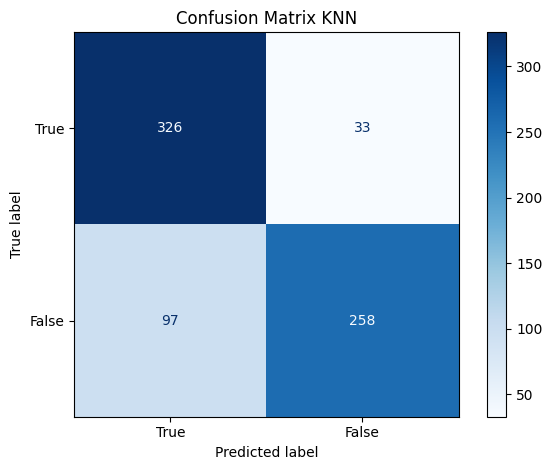

In [29]:
plot_confusion_matrix(y_test, y_pred, report=False, title="Confusion Matrix KNN")

In [30]:
print("X_train shape:", X_train.shape)
print("X_train dtype:", X_train.dtype)

# show min/max values
print("Min value:", X_train.min())
print("Max value:", X_train.max())


X_train shape: (1165, 3072)
X_train dtype: uint8
Min value: 0
Max value: 255


In [31]:
print("Sample 0 shape:", X_train[0].shape)
print("Sample 0 first 20 values:", X_train[0][:20])

Sample 0 shape: (3072,)
Sample 0 first 20 values: [32 36 22 32 36 22 33 36 25 34 37 26 34 37 26 31 34 23 28 31]


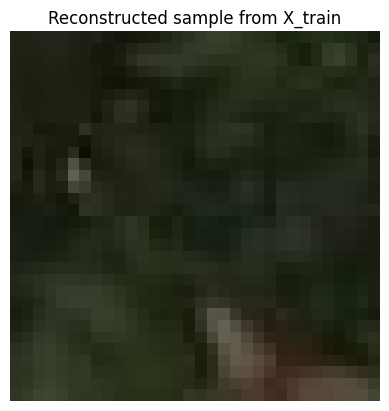

In [32]:
import matplotlib.pyplot as plt

sample = X_train[0].reshape(32, 32, 3).astype(np.uint8)
plt.imshow(sample)
plt.title("Reconstructed sample from X_train")
plt.axis("off")
plt.show()


In [33]:
print("y_train shape:", y_train.shape)
print("y_train example:", y_train[0])


y_train shape: (1165,)
y_train example: 255


### 3.4 Convolutional NN

In [34]:
X_train_val, X_test, y_train_val, y_test = sklearn.model_selection.train_test_split(
    patches_array, labels_array, test_size=0.3, random_state=42, stratify=labels_array 
)

X_train, X_val, y_train, y_val = sklearn.model_selection.train_test_split(
    X_train_val, y_train_val, test_size=0.3, random_state=42, stratify=y_train_val 
)

In [35]:
print(f"Training X: {X_train.shape}, y: {y_train.shape}")
print(f"Validation X: {X_val.shape}, y: {y_val.shape}")
print(f"Test X: {X_test.shape}, y: {y_test.shape}")

Training X: (1165, 32, 32, 3), y: (1165,)
Validation X: (500, 32, 32, 3), y: (500,)
Test X: (714, 32, 32, 3), y: (714,)


In [36]:
def build_model(input_shape, num_classes):
    m = Sequential()
    
    m.add(Conv2D(32, (3,3), padding='same', input_shape=input_shape))
    m.add(Activation('relu'))
    m.add(Conv2D(32, (3,3)))
    m.add(Activation('relu'))
    m.add(MaxPooling2D((2,2)))
    m.add(Dropout(0.25))

    m.add(Conv2D(64, (3,3), padding='same'))
    m.add(Activation('relu'))
    m.add(Conv2D(64, (3,3)))
    m.add(Activation('relu'))
    m.add(MaxPooling2D((2,2)))
    m.add(Dropout(0.25))

    m.add(Flatten())
    m.add(Dense(512))
    m.add(Activation('relu'))
    m.add(Dropout(0.5))
    m.add(Dense(num_classes))
    
    if num_classes == 1:
        m.add(Activation('sigmoid'))
    else:
        m.add(Activation('softmax'))
    
    return m

In [37]:
X_train_norm = X_train.astype(float) / 255
X_val_norm = X_val.astype(float) / 255
X_test_norm = X_test.astype(float) / 255

y_train_bin = y_train / 255 
y_val_bin = y_val / 255
y_test_bin = y_test / 255

In [38]:
model_cnn = build_model(input_shape=X_train.shape[1:], num_classes=1)
model_cnn.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])


c:\Users\nicol\.virtualenvs\Computer_Vision_Project-ZH8_JCKM\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [39]:
history_cnn = compile_fit_with_tabs(
    model_cnn, X_train_norm, y_train_bin, X_val_norm, y_val_bin, 
    epochs=30, batch_size=32, patience=30
)

#### 3.5.1. Analysis of the model 

In [40]:
show_classification_results(
     model=model_cnn, 
     history=history_cnn, 
     X_train=X_train_norm, 
     y_train=y_train_bin,
     X_val=X_val_norm,
     y_val=y_val_bin,
     X_test=X_test_norm,
     y_test=y_test_bin
 )

prova plot percentage 

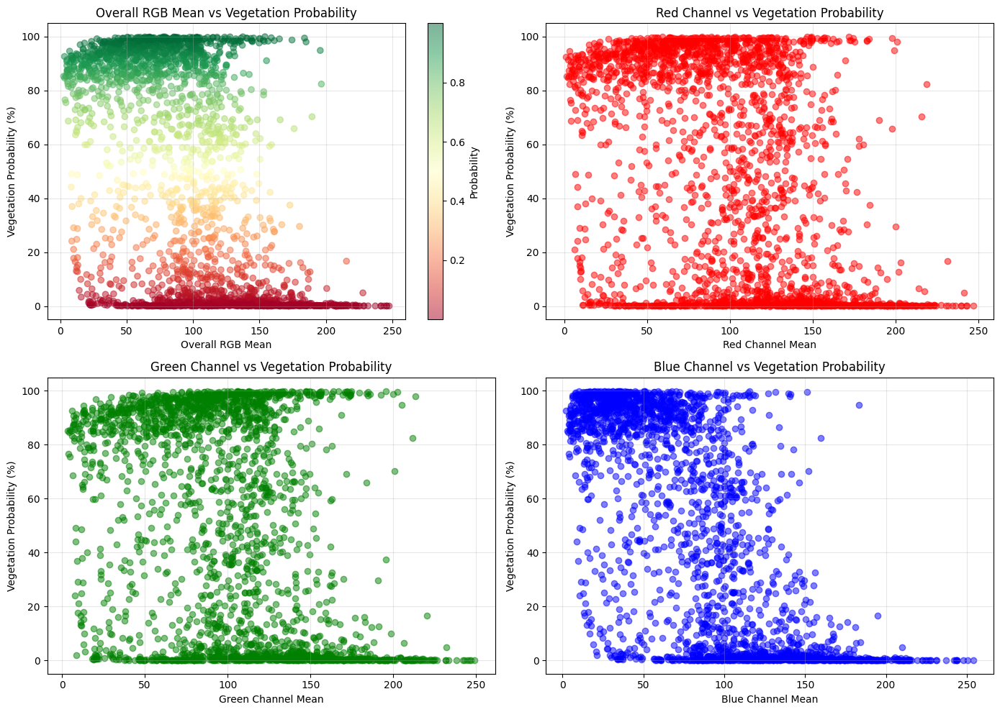

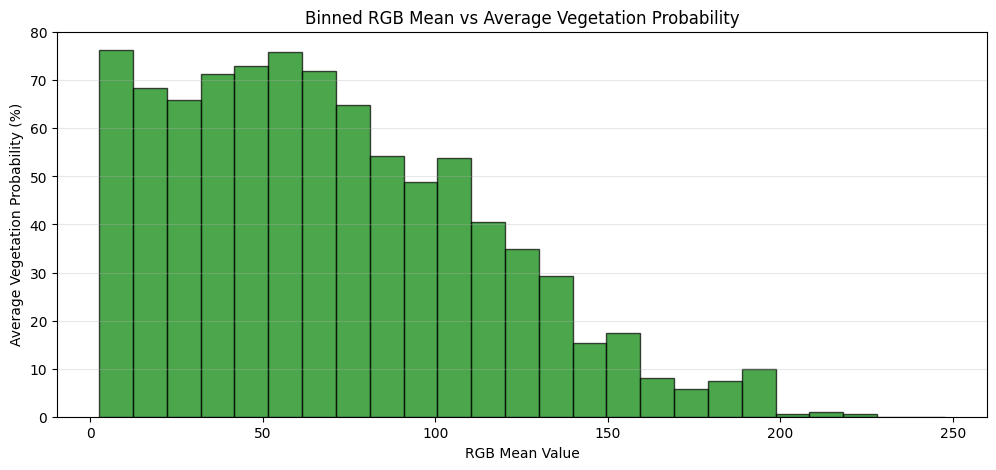

C:\Users\nicol\AppData\Local\Temp\ipykernel_19588\2875799144.py:87: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



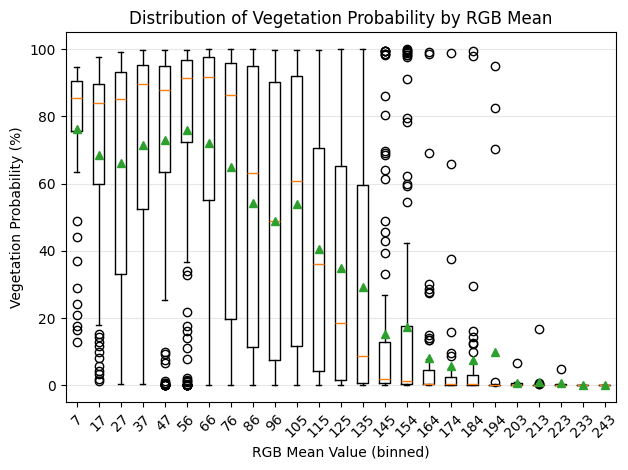

In [41]:
def plot_rgb_vs_vegetation_probability(patches_array, model, bins=20):
    """
    Plot histogram showing relationship between RGB mean values and vegetation probability
    
    Parameters:
    - patches_array: array of image patches
    - model: trained model to predict vegetation probability
    - bins: number of bins for histogram
    """
    # Normalize patches for prediction
    patches_norm = patches_array.astype(float) / 255
    
    # Get model predictions (probability of vegetation)
    predictions = model.predict(patches_norm, verbose=0).flatten()
    
    # Calculate mean RGB for each patch
    rgb_means = patches_array.mean(axis=(1, 2))  # Shape: (n_patches, 3)
    overall_mean = rgb_means.mean(axis=1)  # Overall mean across R, G, B
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Plot 1: Overall RGB mean vs Vegetation Probability
    ax = axes[0, 0]
    scatter = ax.scatter(overall_mean, predictions * 100, alpha=0.5, c=predictions, cmap='RdYlGn')
    ax.set_xlabel('Overall RGB Mean')
    ax.set_ylabel('Vegetation Probability (%)')
    ax.set_title('Overall RGB Mean vs Vegetation Probability')
    ax.grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=ax, label='Probability')
    
    # Plot 2: R channel
    ax = axes[0, 1]
    ax.scatter(rgb_means[:, 0], predictions * 100, alpha=0.5, c='red')
    ax.set_xlabel('Red Channel Mean')
    ax.set_ylabel('Vegetation Probability (%)')
    ax.set_title('Red Channel vs Vegetation Probability')
    ax.grid(True, alpha=0.3)
    
    # Plot 3: G channel
    ax = axes[1, 0]
    ax.scatter(rgb_means[:, 1], predictions * 100, alpha=0.5, c='green')
    ax.set_xlabel('Green Channel Mean')
    ax.set_ylabel('Vegetation Probability (%)')
    ax.set_title('Green Channel vs Vegetation Probability')
    ax.grid(True, alpha=0.3)
    
    # Plot 4: B channel
    ax = axes[1, 1]
    ax.scatter(rgb_means[:, 2], predictions * 100, alpha=0.5, c='blue')
    ax.set_xlabel('Blue Channel Mean')
    ax.set_ylabel('Vegetation Probability (%)')
    ax.set_title('Blue Channel vs Vegetation Probability')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Additional histogram: binned RGB vs average vegetation probability
    plt.figure(figsize=(12, 5))
    
    # Histogram for overall mean
    #plt.subplot(1, 2, 1)
    plt.plot()
    bin_edges = np.linspace(overall_mean.min(), overall_mean.max(), bins + 1)
    bin_indices = np.digitize(overall_mean, bin_edges) - 1
    bin_indices = np.clip(bin_indices, 0, bins - 1)
    
    bin_probs = [predictions[bin_indices == i].mean() * 100 if np.any(bin_indices == i) else 0 
                 for i in range(bins)]
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    plt.bar(bin_centers, bin_probs, width=(bin_edges[1] - bin_edges[0]), 
            color='green', alpha=0.7, edgecolor='black')
    plt.xlabel('RGB Mean Value')
    plt.ylabel('Average Vegetation Probability (%)')
    plt.title('Binned RGB Mean vs Average Vegetation Probability')
    plt.grid(True, alpha=0.3, axis='y')
    plt.show()
    
    # Box plot
    #plt.subplot(1, 2, 2)
    plt.plot()
    bin_data = [predictions[bin_indices == i] * 100 for i in range(bins) if np.any(bin_indices == i)]
    bin_labels = [f'{bin_centers[i]:.0f}' for i in range(bins) if np.any(bin_indices == i)]
    
    plt.boxplot(bin_data, labels=bin_labels, showmeans=True)
    plt.xlabel('RGB Mean Value (binned)')
    plt.ylabel('Vegetation Probability (%)')
    plt.title('Distribution of Vegetation Probability by RGB Mean')
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.show()

# Call the function after training your model
plot_rgb_vs_vegetation_probability(patches_array, model_cnn, bins=25)

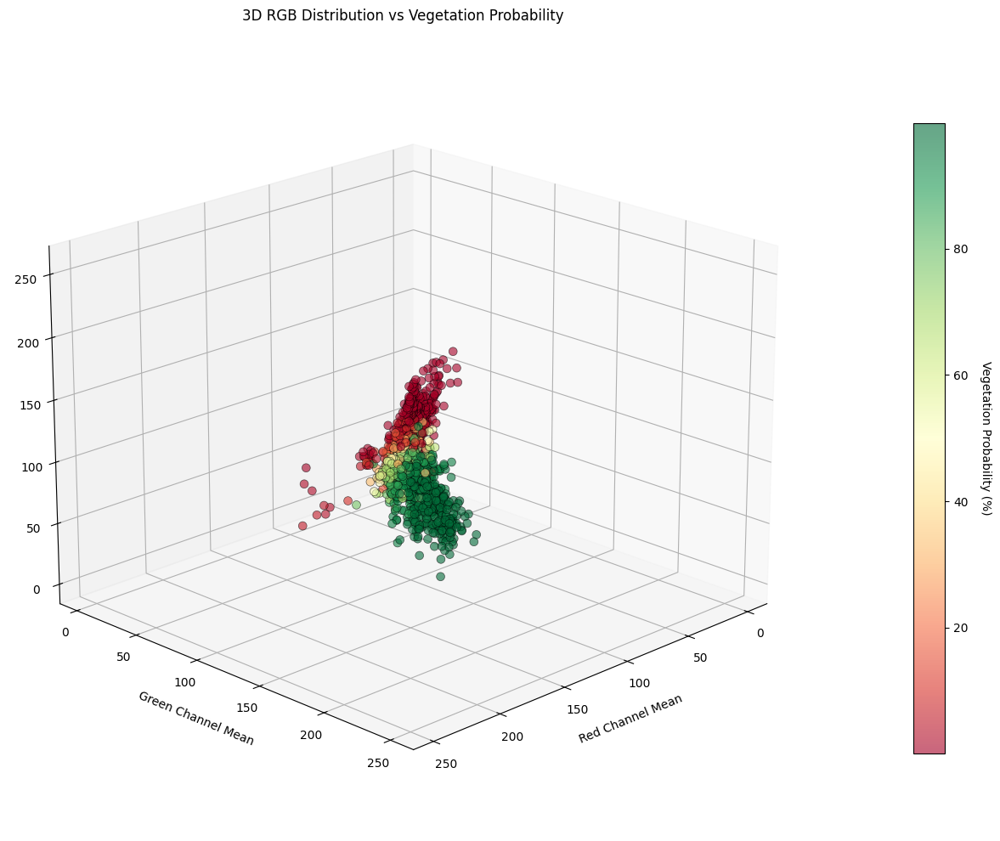

Total patches: 2379
RGB Mean ranges:
  Red:   1.2 - 246.9
  Green: 3.4 - 249.1
  Blue:  2.2 - 254.0
Vegetation probability range: 0.0% - 100.0%


In [42]:
def plot_rgb_3d_vegetation_probability(patches_array, model):
    """
    Create a 3D scatter plot showing RGB values vs vegetation probability
    
    Parameters:
    - patches_array: array of image patches
    - model: trained model to predict vegetation probability
    """
    from mpl_toolkits.mplot3d import Axes3D
    
    # Normalize patches for prediction
    patches_norm = patches_array.astype(float) / 255
    
    # Get model predictions (probability of vegetation)
    predictions = model.predict(patches_norm, verbose=0).flatten()
    
    # Calculate mean RGB for each patch
    rgb_means = patches_array.mean(axis=(1, 2))  # Shape: (n_patches, 3)
    
    # Create 3D plot
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Create scatter plot with color representing vegetation probability
    scatter = ax.scatter(
        rgb_means[:, 0],  # Red channel
        rgb_means[:, 1],  # Green channel
        rgb_means[:, 2],  # Blue channel
        c=predictions * 100,  # Color by vegetation probability
        cmap='RdYlGn',
        s=50,
        alpha=0.6,
        edgecolors='black',
        linewidth=0.5
    )
    
    # Add colorbar
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
    cbar.set_label('Vegetation Probability (%)', rotation=270, labelpad=20)
    
    # Set labels
    ax.set_xlabel('Red Channel Mean', labelpad=10)
    ax.set_ylabel('Green Channel Mean', labelpad=10)
    ax.set_zlabel('Blue Channel Mean', labelpad=10)
    ax.set_title('3D RGB Distribution vs Vegetation Probability', pad=20)
    
    # Set viewing angle for better visualization
    ax.view_init(elev=20, azim=45)
    
    plt.tight_layout()
    plt.show()
    
    # Print some statistics
    print(f"Total patches: {len(predictions)}")
    print(f"RGB Mean ranges:")
    print(f"  Red:   {rgb_means[:, 0].min():.1f} - {rgb_means[:, 0].max():.1f}")
    print(f"  Green: {rgb_means[:, 1].min():.1f} - {rgb_means[:, 1].max():.1f}")
    print(f"  Blue:  {rgb_means[:, 2].min():.1f} - {rgb_means[:, 2].max():.1f}")
    print(f"Vegetation probability range: {predictions.min()*100:.1f}% - {predictions.max()*100:.1f}%")

# Call the function
plot_rgb_3d_vegetation_probability(patches_array, model_cnn)

In [43]:
def plot_rgb_3d_vegetation_probability(patches_array, model):
    """
    Create a 3D scatter plot showing RGB values vs vegetation probability using Plotly
    
    Parameters:
    - patches_array: array of image patches
    - model: trained model to predict vegetation probability
    """
    import plotly.graph_objects as go
    
    # Normalize patches for prediction
    patches_norm = patches_array.astype(float) / 255
    
    # Get model predictions (probability of vegetation)
    predictions = model.predict(patches_norm, verbose=0).flatten()
    
    # Calculate mean RGB for each patch
    rgb_means = patches_array.mean(axis=(1, 2))  # Shape: (n_patches, 3)
    
    # Create 3D scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=rgb_means[:, 0],  # Red channel
        y=rgb_means[:, 1],  # Green channel
        z=rgb_means[:, 2],  # Blue channel
        mode='markers',
        marker=dict(
            size=5,
            color=predictions * 100,  # Color by vegetation probability
            colorscale='RdYlGn',
            showscale=True,
            colorbar=dict(
                title="Vegetation<br>Probability (%)",
                thickness=20,
                len=0.7
            ),
            line=dict(
                color='black',
                width=0.5
            ),
            opacity=0.7
        ),
        text=[f'Veg Prob: {p*100:.1f}%<br>R: {r:.1f}<br>G: {g:.1f}<br>B: {b:.1f}' 
              for p, r, g, b in zip(predictions, rgb_means[:, 0], rgb_means[:, 1], rgb_means[:, 2])],
        hovertemplate='%{text}<extra></extra>'
    )])
    
    # Update layout
    fig.update_layout(
        title='3D RGB Distribution vs Vegetation Probability',
        scene=dict(
            xaxis=dict(title='Red Channel Mean'),
            yaxis=dict(title='Green Channel Mean'),
            zaxis=dict(title='Blue Channel Mean'),
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.3)
            )
        ),
        width=1000,
        height=800
    )
    
    fig.show()
    
    # Print statistics
    print(f"Total patches: {len(predictions)}")
    print(f"RGB Mean ranges:")
    print(f"  Red:   {rgb_means[:, 0].min():.1f} - {rgb_means[:, 0].max():.1f}")
    print(f"  Green: {rgb_means[:, 1].min():.1f} - {rgb_means[:, 1].max():.1f}")
    print(f"  Blue:  {rgb_means[:, 2].min():.1f} - {rgb_means[:, 2].max():.1f}")
    print(f"Vegetation probability range: {predictions.min()*100:.1f}% - {predictions.max()*100:.1f}%")

# Call the function
plot_rgb_3d_vegetation_probability(patches_array, model_cnn)

Total patches: 2379
RGB Mean ranges:
  Red:   1.2 - 246.9
  Green: 3.4 - 249.1
  Blue:  2.2 - 254.0
Vegetation probability range: 0.0% - 100.0%


# fully Convolutional test

## resize image


ridimensionare 100x100 immagine originale e maschera

In [44]:
orig_files = sorted([f for f in os.listdir(paths["orig"]) if f.endswith(".jpg")])
label_files = sorted([f for f in os.listdir(paths["label"]) if f.endswith(".png")])
RGB_files = sorted([f for f in os.listdir(paths["rgb"]) if f.endswith(".png")])

In [45]:
# Check 10 random image sizes
random_indices = random.sample(range(len(orig_files)), min(10, len(orig_files)))

print("Checking sizes of 10 random images:\n")
print(f"{'Index':<10} {'Filename':<15} {'Original':<15} {'Label':<15} {'RGB':<15}")
print("=" * 70)

for idx in random_indices:
    orig_file = orig_files[idx]
    label_file = label_files[idx]
    rgb_file = RGB_files[idx]
    
    orig_size = Image.open(os.path.join(paths["orig"], orig_file)).size
    label_size = Image.open(os.path.join(paths["label"], label_file)).size
    rgb_size = Image.open(os.path.join(paths["rgb"], rgb_file)).size
    
    print(f"{idx:<10} {orig_file:<15} {str(orig_size):<15} {str(label_size):<15} {str(rgb_size):<15}")

Checking sizes of 10 random images:

Index      Filename        Original        Label           RGB            
160        230.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
395        592.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
284        427.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
35         056.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
200        294.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
151        219.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
52         080.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
346        518.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
204        299.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   
222        323.jpg         (6000, 4000)    (6000, 4000)    (6000, 4000)   


In [46]:
resize_and_save_all(paths, out_root="dataset/resized_100", wscale=0.0246666667, hscale=0.025)


Saved 400 images in: dataset/resized_100\orig
Saved 400 images in: dataset/resized_100\label
Saved 400 images in: dataset/resized_100\rgb


In [47]:
orig_100, label_100, rgb_100= load_resized_images(
    "dataset/resized_100/orig",
    "dataset/resized_100/label",
    "dataset/resized_100/rgb"
)

In [48]:
import os
from PIL import Image

def check_sizes(folder):
    sizes = set()
    for f in sorted(os.listdir(folder)):
        if f.lower().endswith((".png", ".jpg", ".jpeg")):
            w,h = Image.open(os.path.join(folder, f)).size
            sizes.add((w,h))
    return sizes

print("orig sizes:",  check_sizes("dataset/resized_100/orig"))
print("label sizes:", check_sizes("dataset/resized_100/label"))
print("rgb sizes:",   check_sizes("dataset/resized_100/rgb"))


orig sizes: {(148, 100)}
label sizes: {(148, 100)}
rgb sizes: {(148, 100)}


## binary mask

In [49]:
binary_mask_100 = []

for image in rgb_100:
        
    arr = np.array(image)

    # binarization 1 for vegetable and 0 otherwise
    mask = (np.all(arr == vegetation, axis=-1) | np.all(arr == grass, axis=-1) | np.all(arr == tree, axis=-1))
    mask_img = mask.astype(np.uint8) * 255

    binary_mask_100.append(mask_img)

In [50]:
len(binary_mask_100)

400

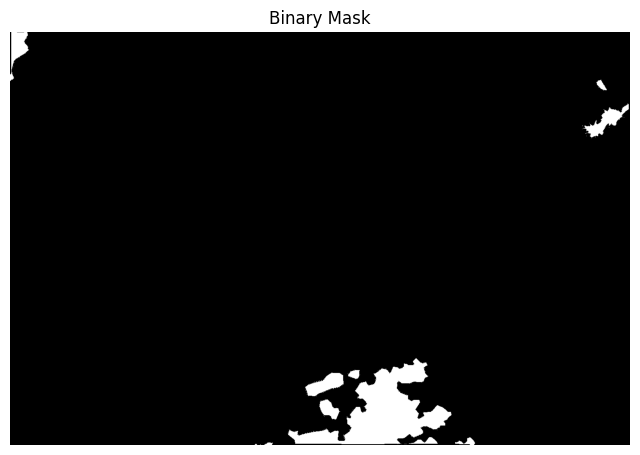

In [51]:
plt.figure(figsize=(8, 6))
plt.imshow(binary_im[0], cmap='gray')
plt.title("Binary Mask")
plt.axis('off')
plt.show()

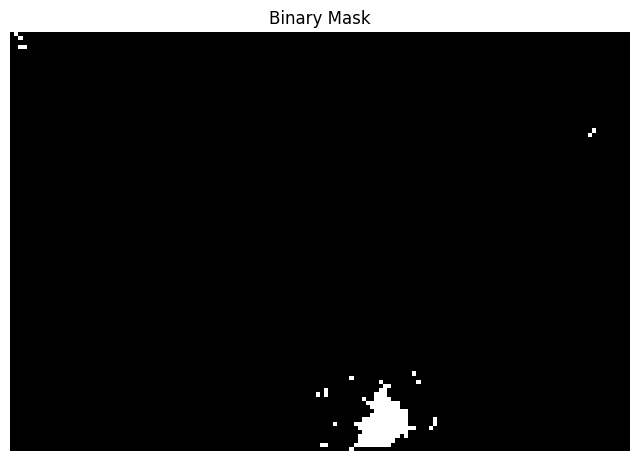

In [52]:
plt.figure(figsize=(8, 6))
plt.imshow(binary_mask_100[0], cmap='gray')
plt.title("Binary Mask")
plt.axis('off')
plt.show()

## Train test

In [53]:
# Convert PIL images to numpy arrays BEFORE splitting
print("Converting PIL images to numpy arrays...")
orig_100_np = np.array([np.array(img) for img in orig_100]).astype('float32') / 255.0
binary_mask_100_np = np.array(binary_mask_100).astype('float32') / 255.0

# Add channel dimension to masks
binary_mask_100_np = np.expand_dims(binary_mask_100_np, axis=-1)

print(f"\nConverted arrays:")
print(f"orig_100_np shape: {orig_100_np.shape}")  # Should be (400, 100, 150, 3)
print(f"binary_mask_100_np shape: {binary_mask_100_np.shape}")  # Should be (400, 100, 150, 1)
print(f"Value ranges: images [{orig_100_np.min():.3f}, {orig_100_np.max():.3f}], masks {np.unique(binary_mask_100_np)}")

Converting PIL images to numpy arrays...

Converted arrays:
orig_100_np shape: (400, 100, 148, 3)
binary_mask_100_np shape: (400, 100, 148, 1)
Value ranges: images [0.000, 1.000], masks [0. 1.]


In [54]:
X_train_val_100, X_test_100, y_train_val_100, y_test_100 = sklearn.model_selection.train_test_split(
    orig_100_np, 
    binary_mask_100_np,
    test_size=0.1,  
    random_state=42, 
)


X_train_100, X_val_100, y_train_100, y_val_100 = sklearn.model_selection.train_test_split(
    X_train_val_100, 
    y_train_val_100, 
    test_size=0.1, 
    random_state=42, 

)

## model

In [55]:
import keras
import keras.layers
import tensorflow as tf

def mkmodel():
    input_layer = keras.Input(shape=(None, None, 3), name='input')
    x = keras.layers.Conv2D(filters=4, kernel_size=(3,3), padding='same', activation='relu')(input_layer)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.SeparableConv2D(filters=8, kernel_size=(3,3), padding='same', activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x1 = x
    x = keras.layers.MaxPooling2D(2)(x)
    x = keras.layers.SeparableConv2D(filters=16, kernel_size=(3,3), padding='same', activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x2 = x
    x = keras.layers.MaxPooling2D(2)(x)
    x = keras.layers.SeparableConv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.SeparableConv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.UpSampling2D(2)(x)
    x = keras.layers.Concatenate()([x,x2]) # Skip connections
    x = keras.layers.SeparableConv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.UpSampling2D(2)(x)
    x = keras.layers.Concatenate()([x,x1]) # Skip connections
    x = keras.layers.SeparableConv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Conv2D(filters=128, kernel_size=(1,1), padding='same', activation='relu')(x)
    x = keras.layers.Conv2D(filters=1, kernel_size=(1,1), padding='same', activation='sigmoid')(x)
    return keras.Model(input_layer, x)
model = mkmodel()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
              loss=keras.losses.BinaryCrossentropy(from_logits=False), 
              metrics=[keras.metrics.BinaryAccuracy()])
print(model.summary())

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, None,      │          0 │ -                 │
│                     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │        112 │ input[0][0]       │
│                     │ None, 4)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         16 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 4)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d    │ (None, None,      │         76 │ batch_normalizat… │
│ (SeparableConv2D)   │ None, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         32 │ separable_conv2d… │
│ (BatchNormalizatio… │ None, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, None,      │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ None, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_1  │ (None, None,      │        216 │ max_pooling2d_2[… │
│ (SeparableConv2D)   │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         64 │ separable_conv2d… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, None,      │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_2  │ (None, None,      │        688 │ max_pooling2d_3[… │
│ (SeparableConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        128 │ separable_conv2d… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_3  │ (None, None,      │      1,344 │ batch_normalizat… │
│ (SeparableConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        128 │ separable_conv2d… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, None,      │          0 │ batch_normalizat… │
│ (UpSampling2D)      │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, None,      │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ None, 48)         │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_4  │ (None, None,      │      2,000 │ concatenate[0][0] │
│ (SeparableConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        128 │ separable_conv2d

 Total params: 11,085 (43.30 KB)

 Trainable params: 10,773 (42.08 KB)

 Non-trainable params: 312 (1.22 KB)

None


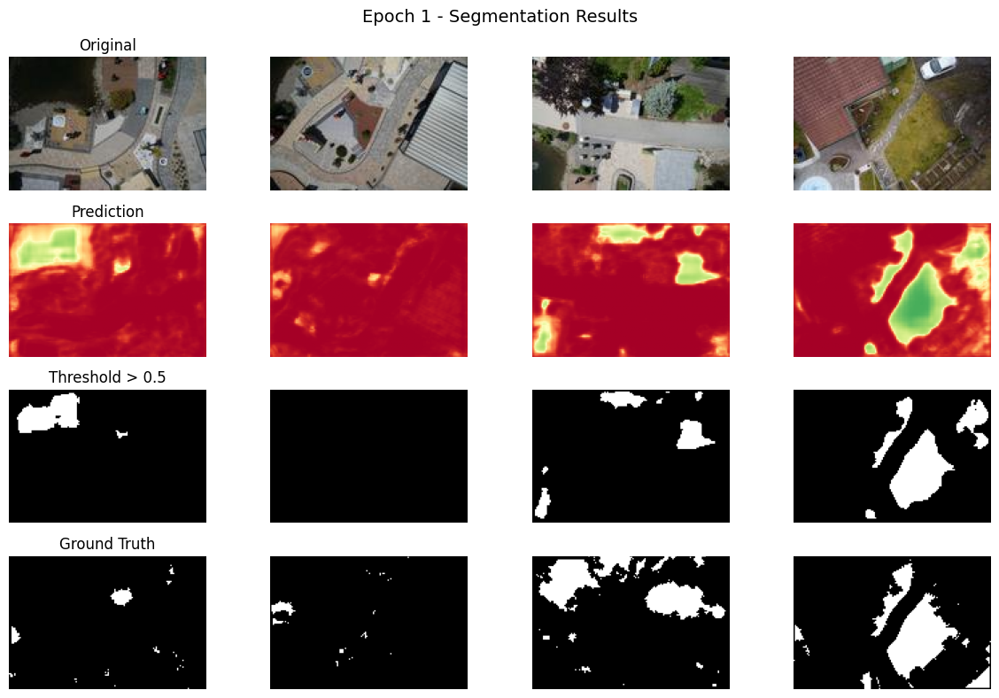


=== Training Epoch 1 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - binary_accuracy: 0.8859 - loss: 0.2703 - val_binary_accuracy: 0.8767 - val_loss: 0.2588
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.8857 - loss: 0.2616 - val_binary_accuracy: 0.8132 - val_loss: 0.3689


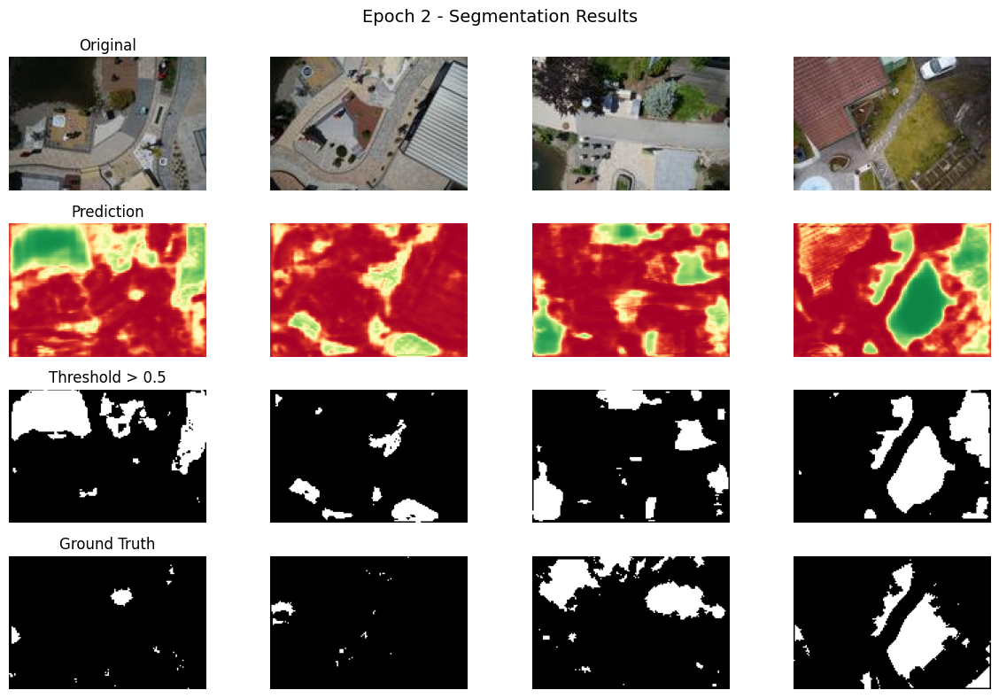


=== Training Epoch 2 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.8905 - loss: 0.2533 - val_binary_accuracy: 0.9012 - val_loss: 0.2295
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - binary_accuracy: 0.9085 - loss: 0.2184 - val_binary_accuracy: 0.8813 - val_loss: 0.3285


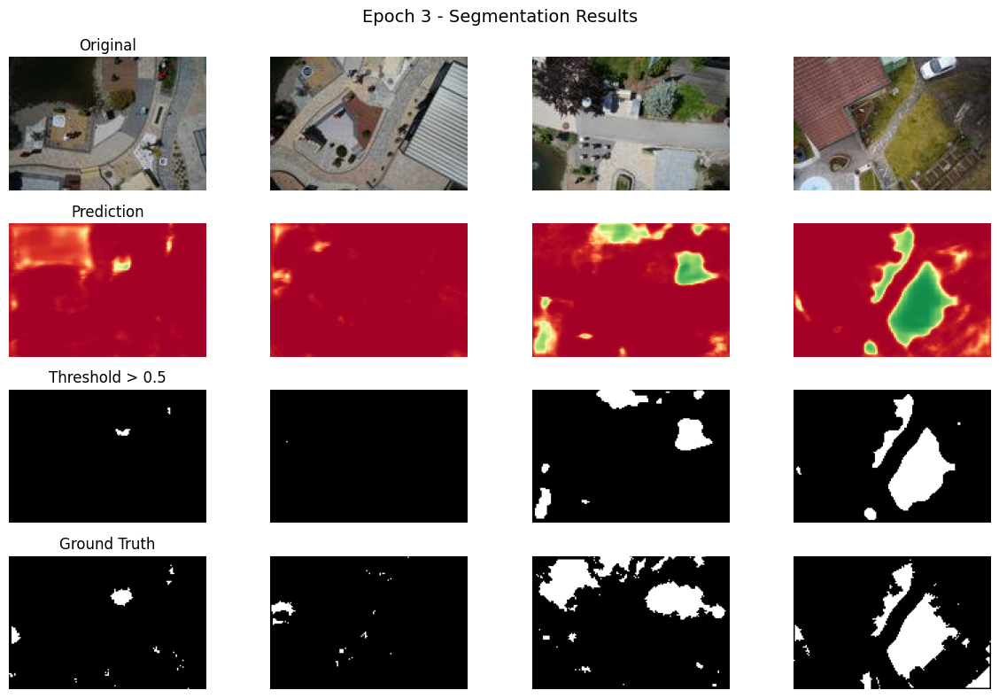


=== Training Epoch 3 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9066 - loss: 0.2175 - val_binary_accuracy: 0.8742 - val_loss: 0.3197
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - binary_accuracy: 0.9052 - loss: 0.2275 - val_binary_accuracy: 0.8747 - val_loss: 0.2525


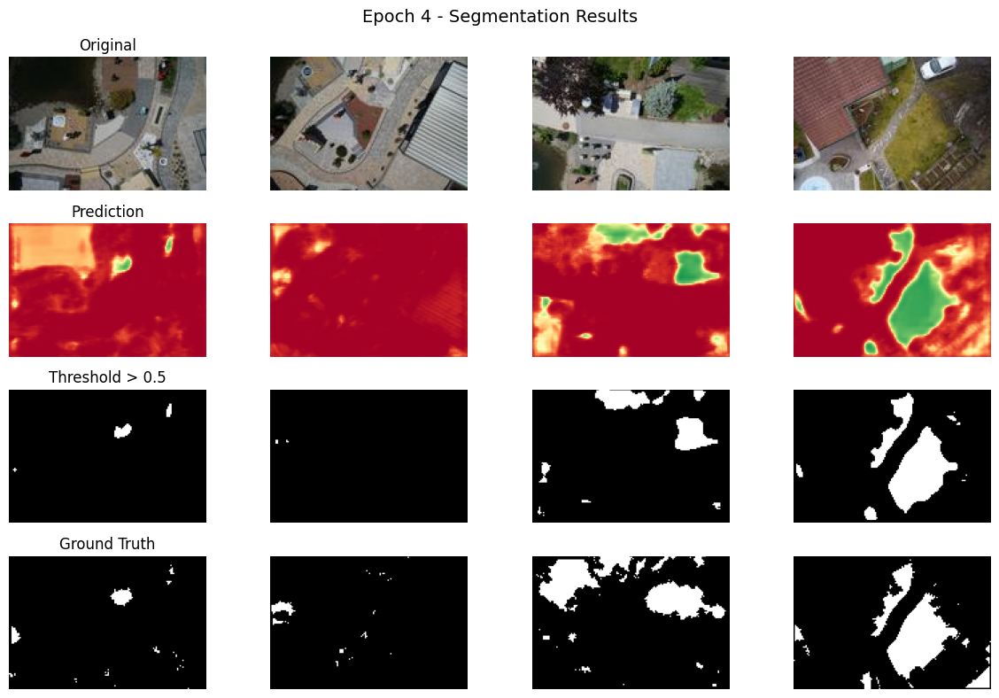


=== Training Epoch 4 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - binary_accuracy: 0.9019 - loss: 0.2371 - val_binary_accuracy: 0.7778 - val_loss: 6.1231
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - binary_accuracy: 0.8770 - loss: 0.2896 - val_binary_accuracy: 0.7644 - val_loss: 6.0874


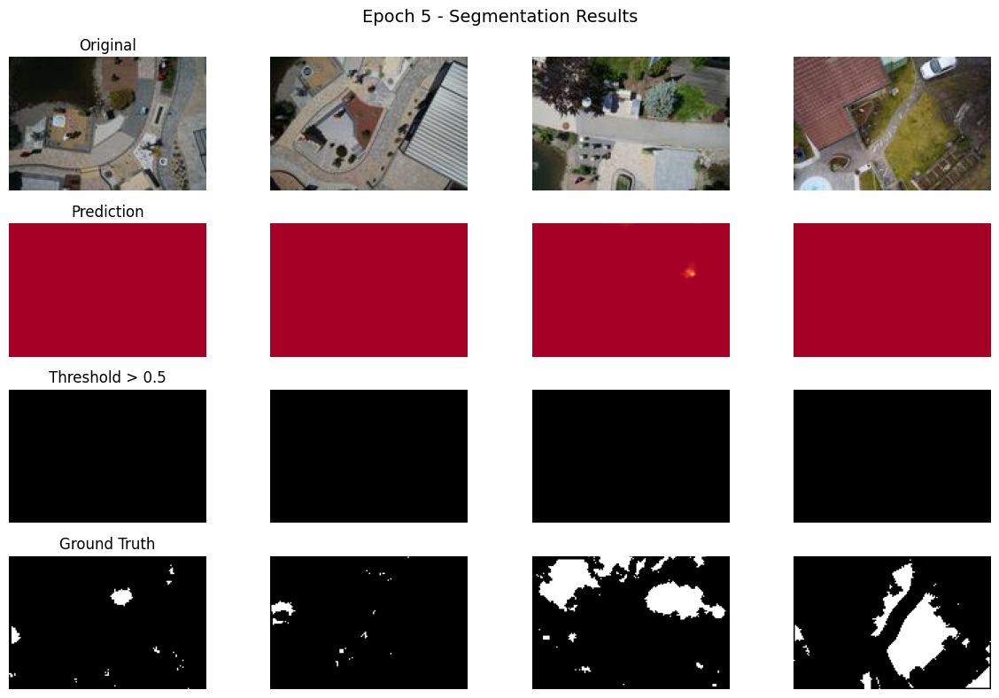


=== Training Epoch 5 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - binary_accuracy: 0.8832 - loss: 0.2810 - val_binary_accuracy: 0.7985 - val_loss: 1.4211
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - binary_accuracy: 0.8993 - loss: 0.2286 - val_binary_accuracy: 0.8311 - val_loss: 0.9715


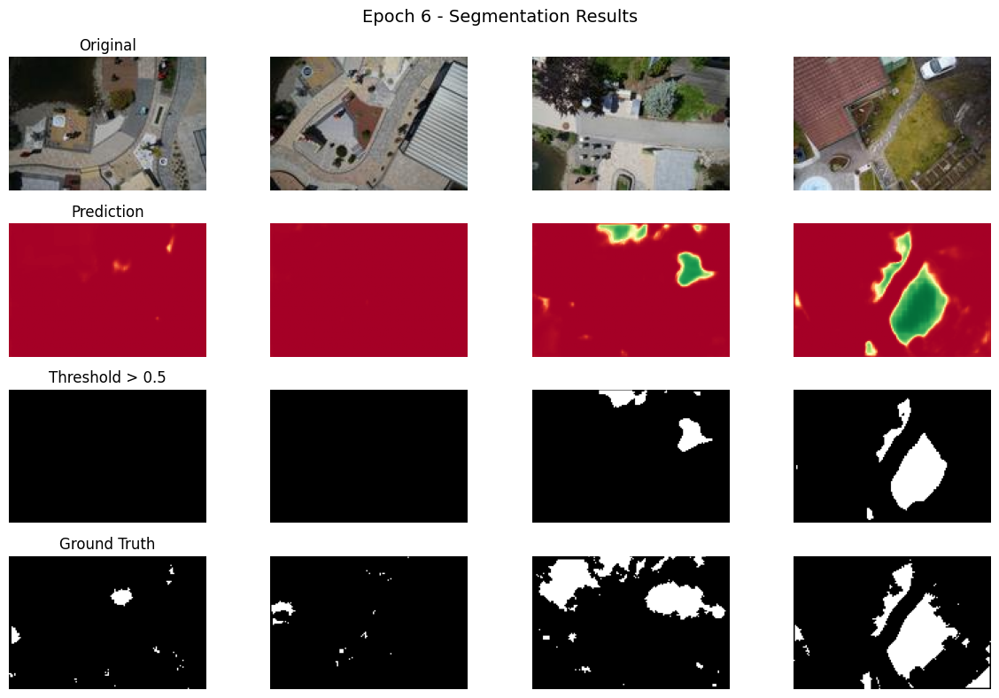


=== Training Epoch 6 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - binary_accuracy: 0.9047 - loss: 0.2318 - val_binary_accuracy: 0.8925 - val_loss: 0.2382
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - binary_accuracy: 0.9108 - loss: 0.2117 - val_binary_accuracy: 0.8725 - val_loss: 0.3201


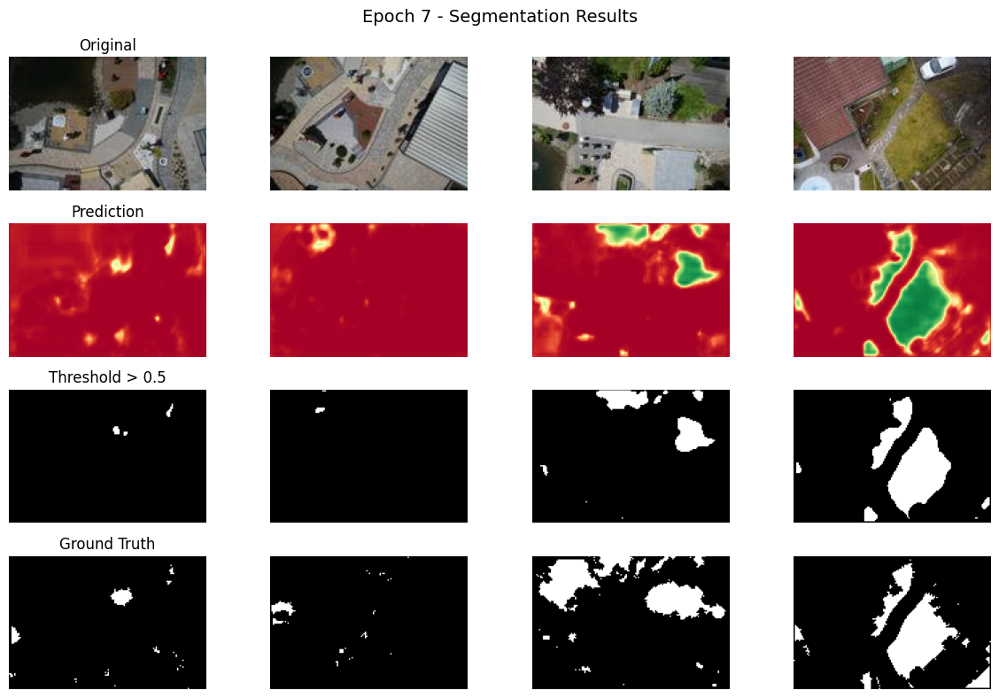


=== Training Epoch 7 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - binary_accuracy: 0.9111 - loss: 0.2095 - val_binary_accuracy: 0.8757 - val_loss: 0.3093
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - binary_accuracy: 0.9122 - loss: 0.2104 - val_binary_accuracy: 0.8924 - val_loss: 0.2369


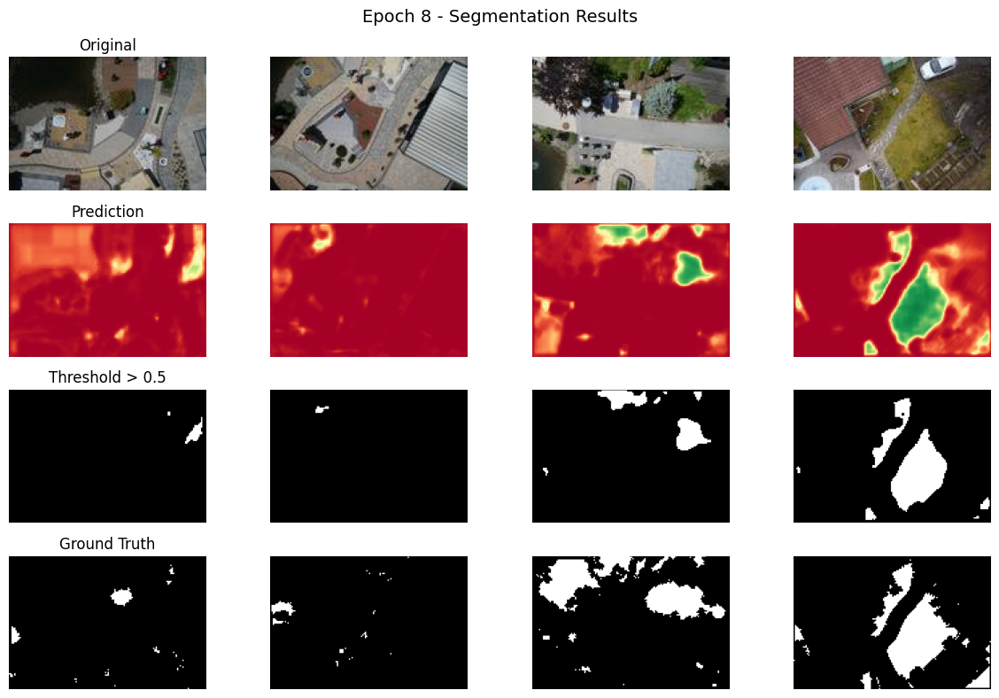


=== Training Epoch 8 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - binary_accuracy: 0.9106 - loss: 0.2144 - val_binary_accuracy: 0.8859 - val_loss: 0.2783
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9165 - loss: 0.1997 - val_binary_accuracy: 0.9029 - val_loss: 0.2234


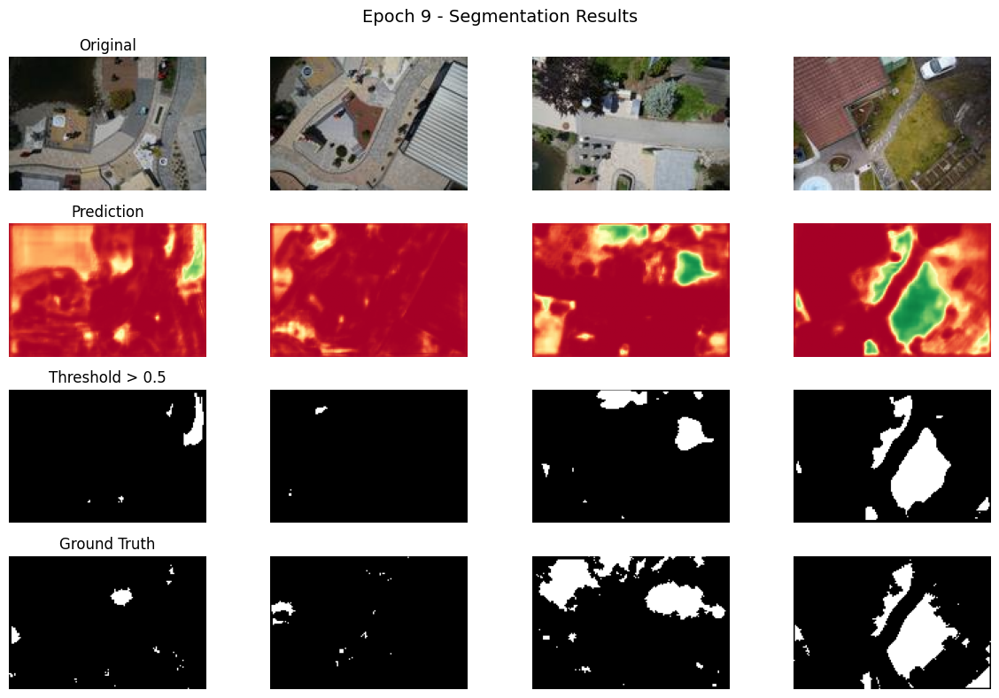


=== Training Epoch 9 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - binary_accuracy: 0.9113 - loss: 0.2119 - val_binary_accuracy: 0.8505 - val_loss: 0.3475
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9109 - loss: 0.2119 - val_binary_accuracy: 0.8457 - val_loss: 0.3625


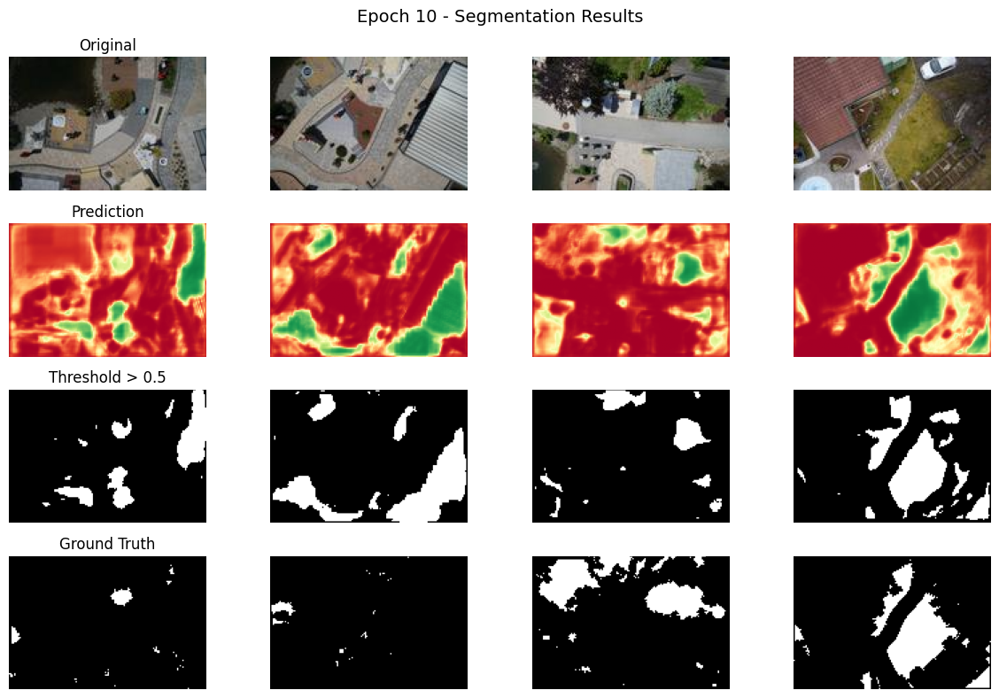


=== Training Epoch 10 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9083 - loss: 0.2230 - val_binary_accuracy: 0.8567 - val_loss: 0.3003
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9148 - loss: 0.2046 - val_binary_accuracy: 0.9001 - val_loss: 0.2376


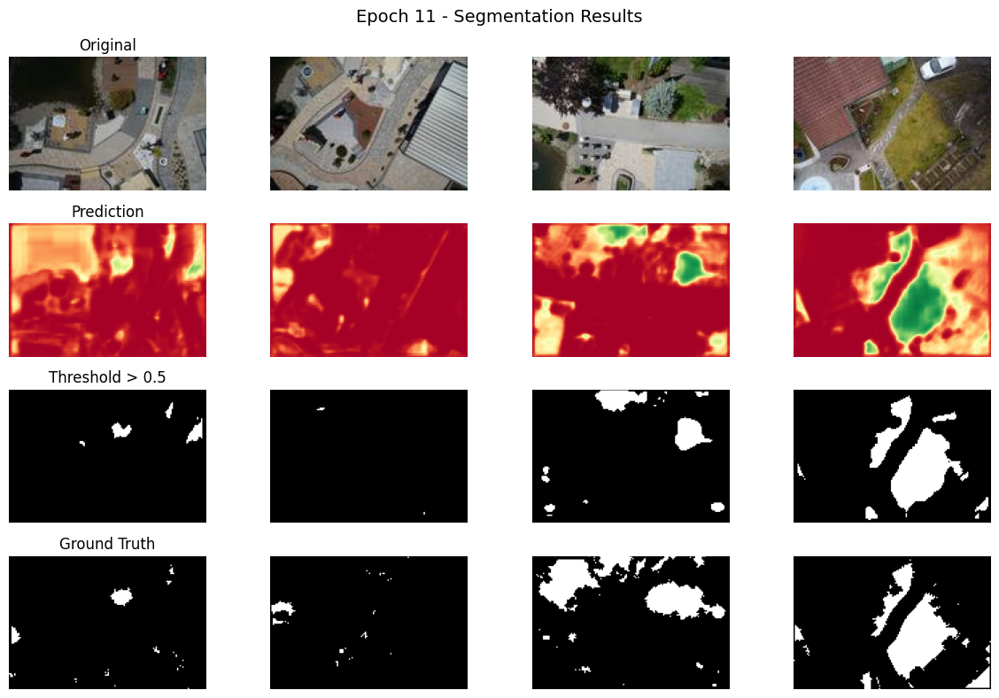


=== Training Epoch 11 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9058 - loss: 0.2242 - val_binary_accuracy: 0.8739 - val_loss: 0.2812
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - binary_accuracy: 0.9187 - loss: 0.1929 - val_binary_accuracy: 0.8781 - val_loss: 0.2820


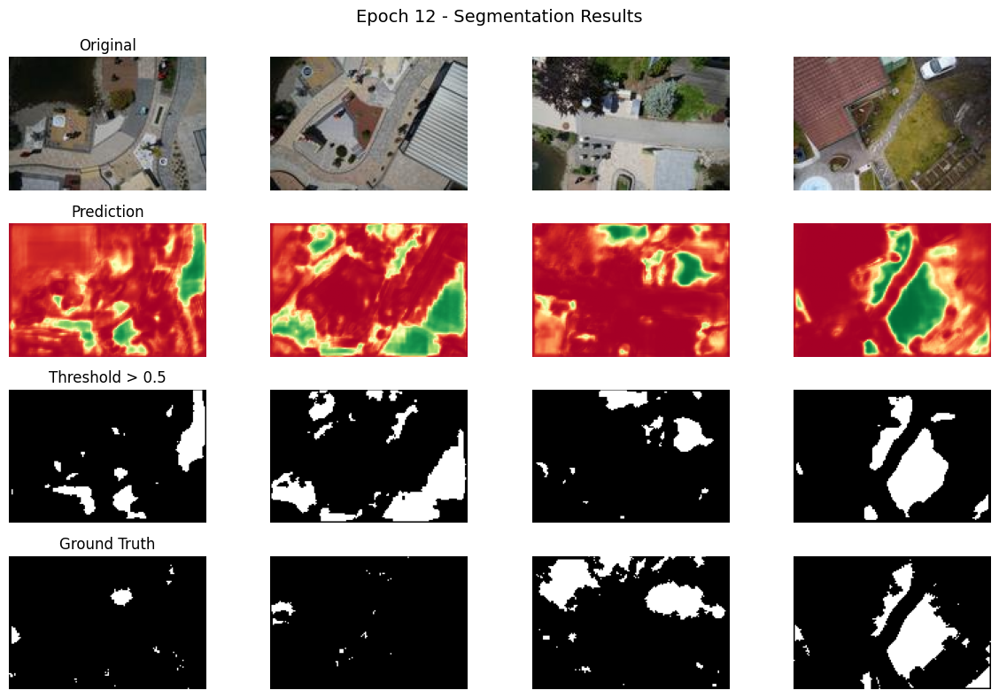


=== Training Epoch 12 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - binary_accuracy: 0.9195 - loss: 0.1920 - val_binary_accuracy: 0.8591 - val_loss: 0.3534
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - binary_accuracy: 0.9195 - loss: 0.1919 - val_binary_accuracy: 0.8487 - val_loss: 0.3880


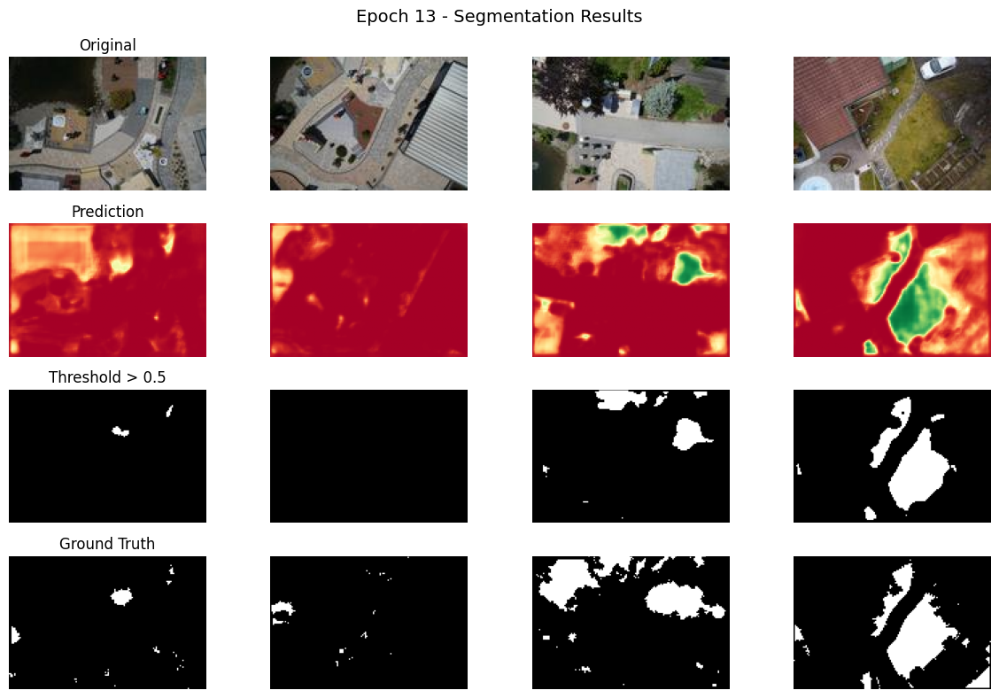


=== Training Epoch 13 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9157 - loss: 0.1986 - val_binary_accuracy: 0.8812 - val_loss: 0.2614
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9201 - loss: 0.1899 - val_binary_accuracy: 0.8870 - val_loss: 0.2575


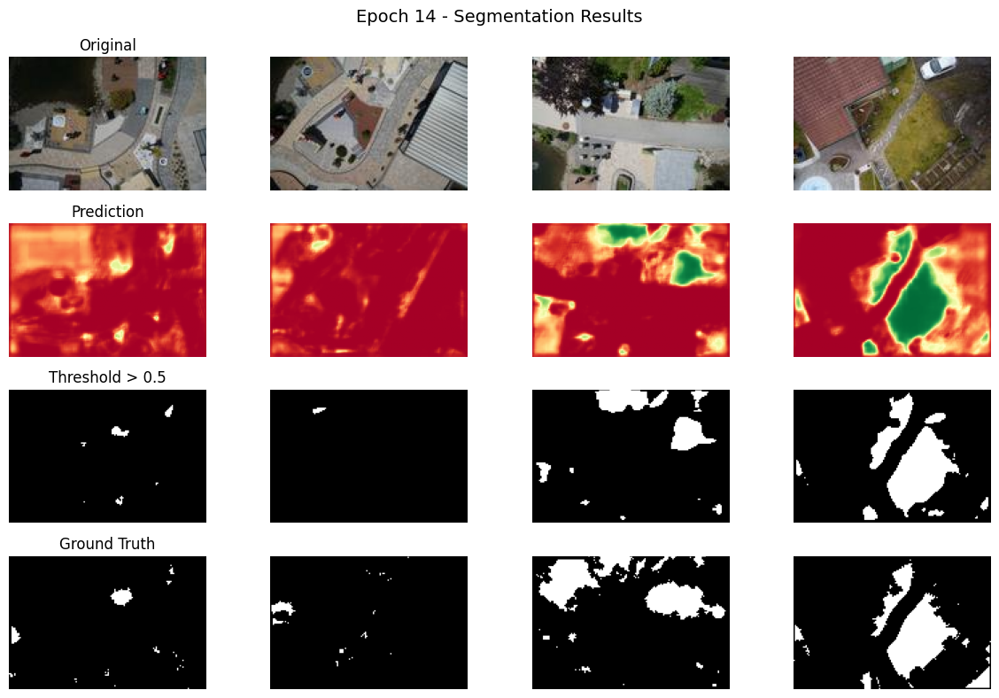


=== Training Epoch 14 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - binary_accuracy: 0.9205 - loss: 0.2019 - val_binary_accuracy: 0.8688 - val_loss: 0.2852
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9178 - loss: 0.1961 - val_binary_accuracy: 0.8867 - val_loss: 0.2540


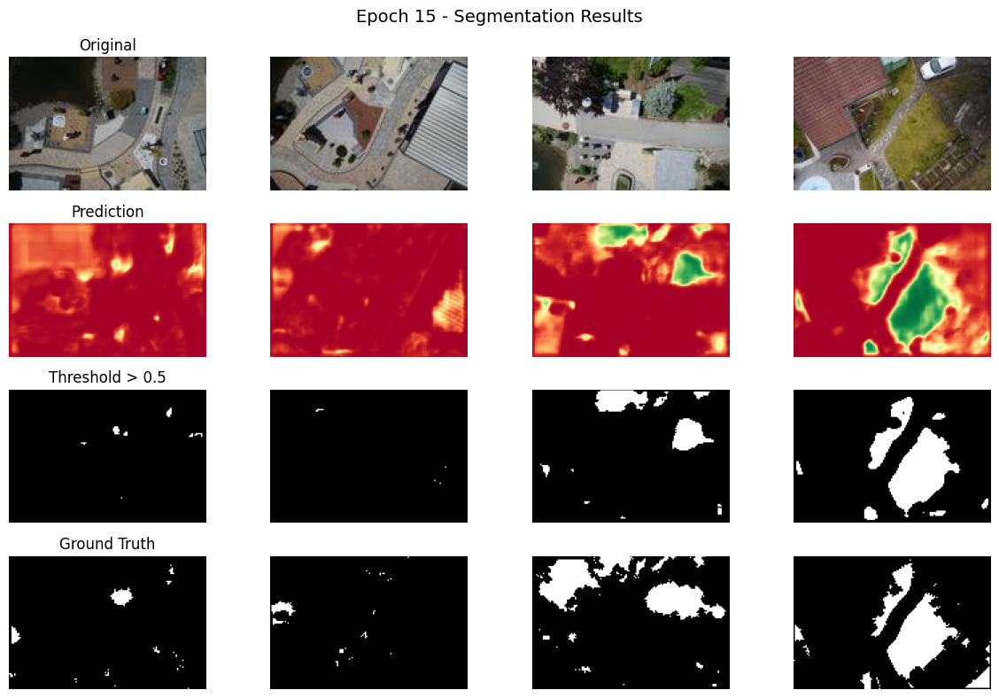


=== Training Epoch 15 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9207 - loss: 0.1901 - val_binary_accuracy: 0.8716 - val_loss: 0.2979
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9184 - loss: 0.1987 - val_binary_accuracy: 0.9010 - val_loss: 0.2396


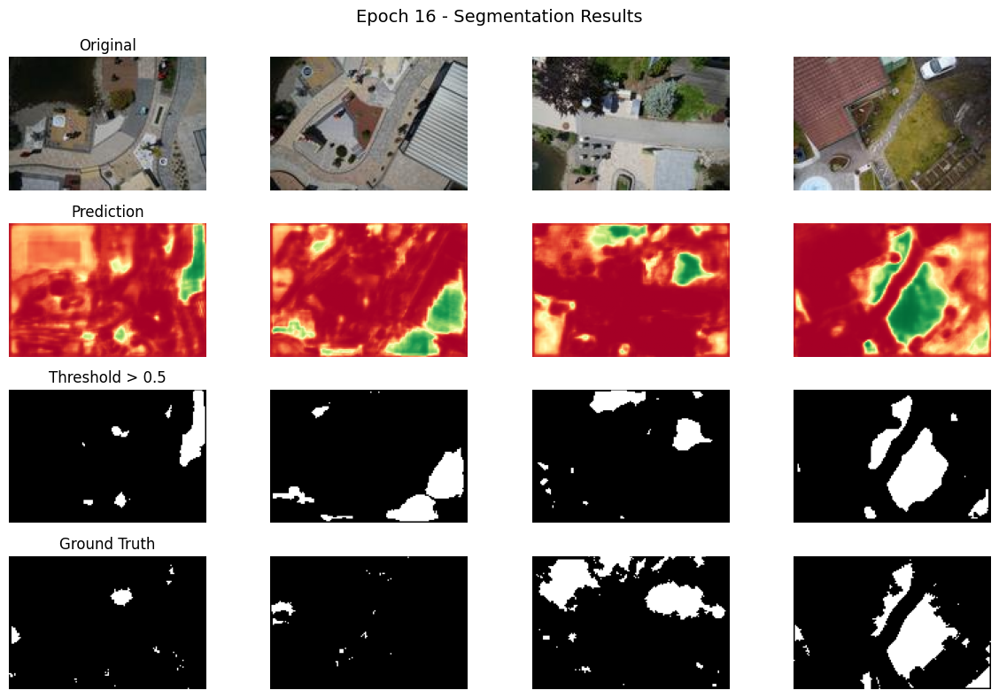


=== Training Epoch 16 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9258 - loss: 0.1829 - val_binary_accuracy: 0.9045 - val_loss: 0.2155
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9205 - loss: 0.1928 - val_binary_accuracy: 0.8607 - val_loss: 0.3210


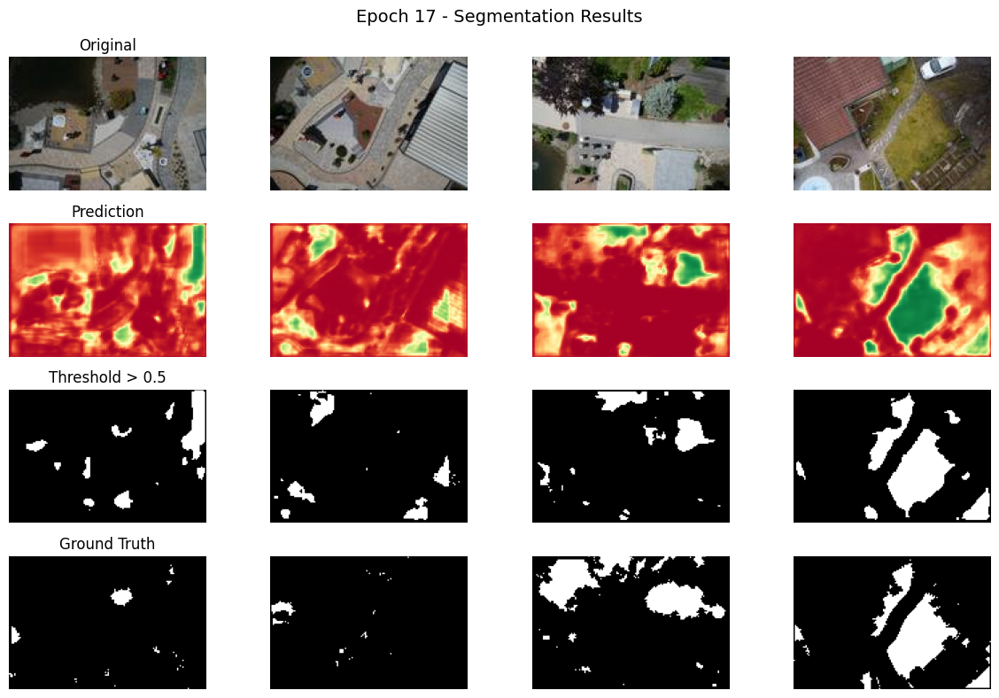


=== Training Epoch 17 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9193 - loss: 0.1955 - val_binary_accuracy: 0.9013 - val_loss: 0.2433
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9174 - loss: 0.1966 - val_binary_accuracy: 0.8706 - val_loss: 0.2767


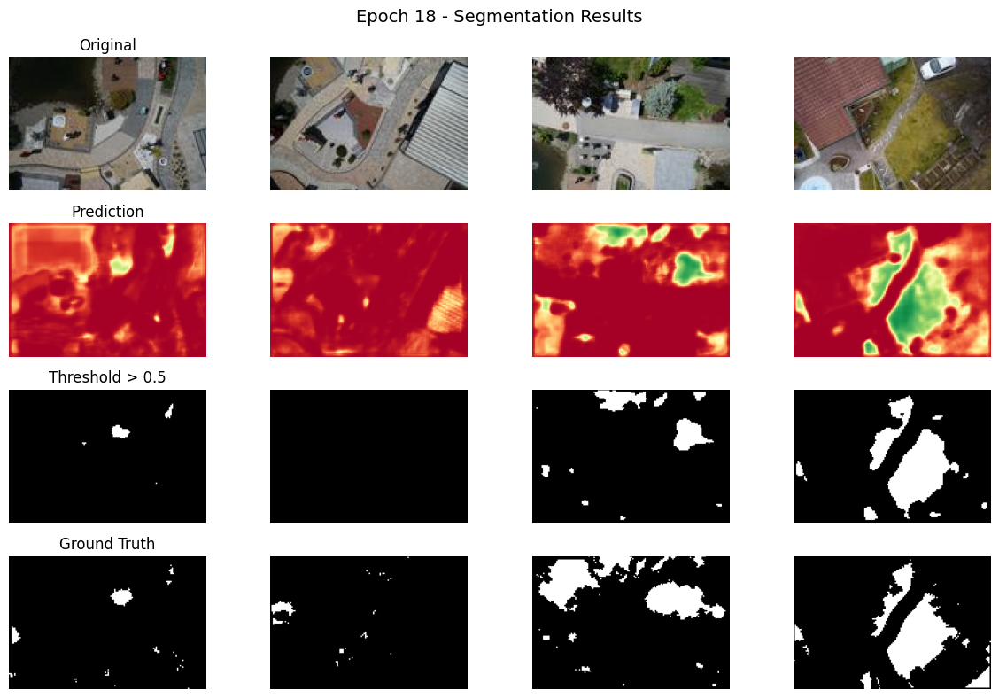


=== Training Epoch 18 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9232 - loss: 0.1814 - val_binary_accuracy: 0.8926 - val_loss: 0.2330
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - binary_accuracy: 0.9248 - loss: 0.1817 - val_binary_accuracy: 0.8459 - val_loss: 0.3557


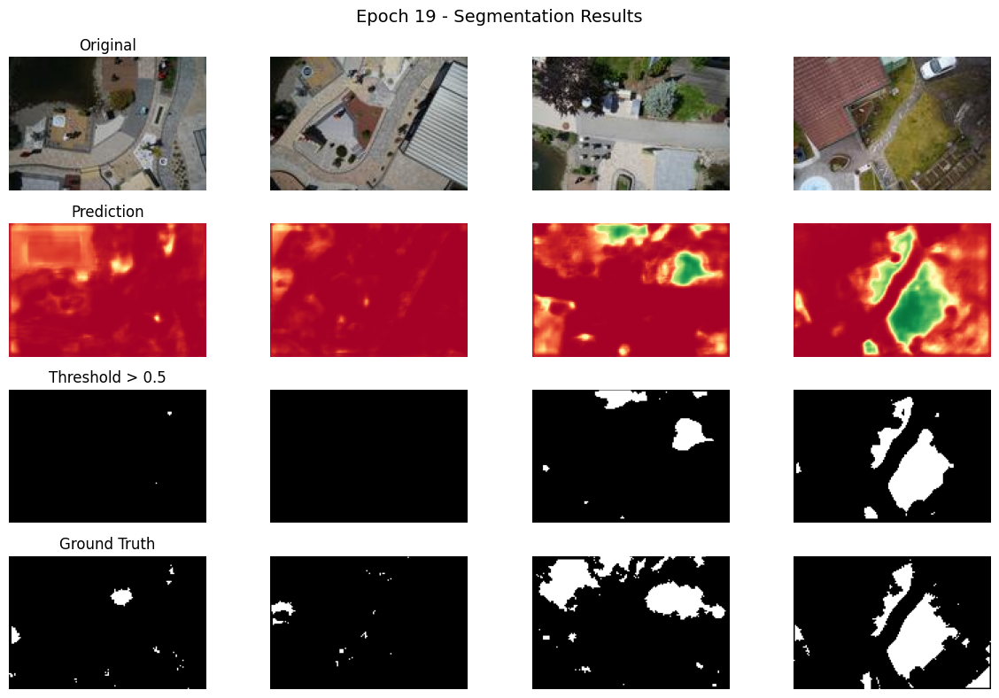


=== Training Epoch 19 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - binary_accuracy: 0.9196 - loss: 0.1997 - val_binary_accuracy: 0.8870 - val_loss: 0.2466
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - binary_accuracy: 0.9179 - loss: 0.1992 - val_binary_accuracy: 0.9041 - val_loss: 0.2191


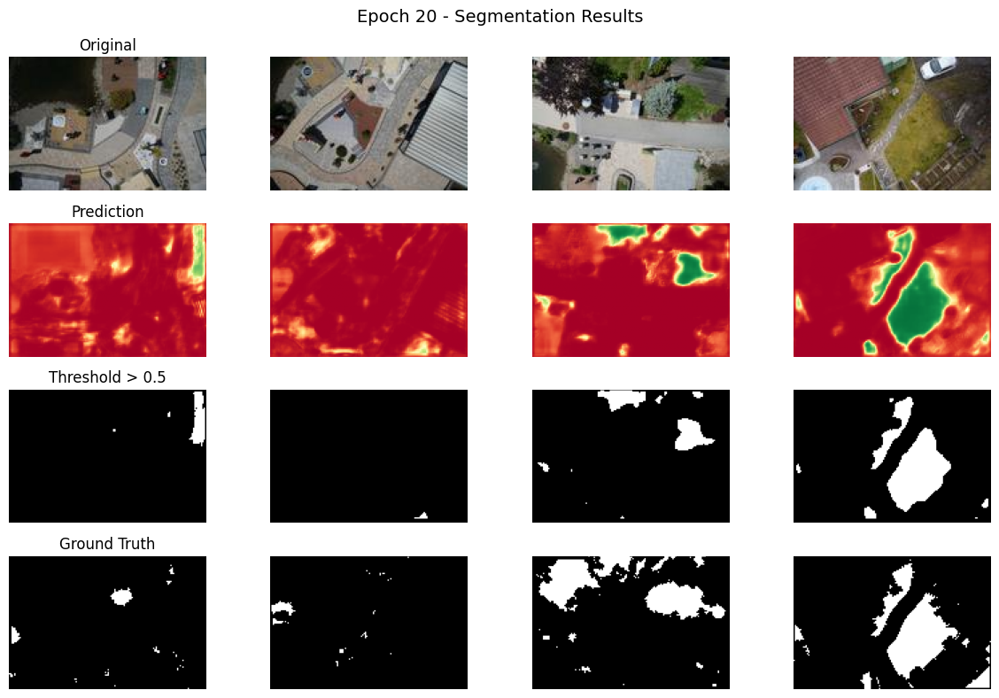


=== Training Epoch 20 ===
Epoch 1/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - binary_accuracy: 0.9173 - loss: 0.2009 - val_binary_accuracy: 0.8208 - val_loss: 0.3828
Epoch 2/2
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - binary_accuracy: 0.9182 - loss: 0.1954 - val_binary_accuracy: 0.8434 - val_loss: 0.4156


In [57]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")

ntest = min(4, len(X_test_100))  # Visualize up to 4 test images

for epoch in range(20):

    # ---- PREDICT ON TEST SET ----
    tyhat = model.predict(X_test_100, verbose=0)

    # ---- VISUALIZATION ----
    fig, axs = plt.subplots(nrows=4, ncols=ntest, figsize=(12, 8))

    for ti in range(ntest):
        # Row 0: Original image
        axs[0, ti].imshow(X_test_100[ti])
        axs[0, ti].set_title("Original" if ti == 0 else "")

        # Row 1: Raw predicted probability
        axs[1, ti].imshow(tyhat[ti, :, :, 0], vmin=0, vmax=1, cmap='RdYlGn')
        axs[1, ti].set_title("Prediction" if ti == 0 else "")

        # Row 2: Thresholded binary mask
        axs[2, ti].imshow(tyhat[ti, :, :, 0] > 0.5, cmap='gray')
        axs[2, ti].set_title("Threshold > 0.5" if ti == 0 else "")

        # Row 3: Ground truth
        axs[3, ti].imshow(y_test_100[ti, :, :, 0], cmap='gray')
        axs[3, ti].set_title("Ground Truth" if ti == 0 else "")

    for ax in axs.flatten():
        ax.axis("off")

    plt.suptitle(f"Epoch {epoch+1} - Segmentation Results", fontsize=14)
    plt.tight_layout()
    plt.show()

    # ---- TRAINING ----
    print(f"\n=== Training Epoch {epoch + 1} ===")

    history = model.fit(
        X_train_100, y_train_100,
        validation_data=(X_val_100, y_val_100),
        epochs=2,
        batch_size=8,
        callbacks=[tensorboard_callback],
        verbose=1
    )


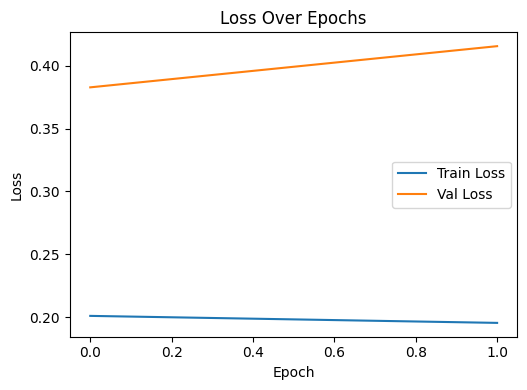

In [62]:
import matplotlib.pyplot as plt

def plot_training_curves(history):
    # Loss
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Over Epochs")
    plt.xlabel("Epoch"); plt.ylabel("Loss")
    plt.legend()

    # Metrics (Dice / IoU / Accuracy)
    if "accuracy" in history.history:
        plt.subplot(1,2,2)
        plt.plot(history.history["accuracy"], label="Train Acc")
        plt.plot(history.history["val_accuracy"], label="Val Acc")
        plt.title("Accuracy Over Epochs")
        plt.xlabel("Epoch"); plt.ylabel("Accuracy")
        plt.legend()

    if "dice_coef" in history.history:
        plt.subplot(1,2,2)
        plt.plot(history.history["dice_coef"], label="Train Dice")
        plt.plot(history.history["val_dice_coef"], label="Val Dice")
        plt.title("Dice Coefficient Over Epochs")
        plt.xlabel("Epoch"); plt.ylabel("Dice")
        plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_curves(history)